# Data Connection

In [ ]:
from google.colab import files
files.upload()

Saving bank-additional-full.xlsx to bank-additional-full.xlsx


{'bank-additional-full.xlsx': b'PK\x03\x04\x14\x00\x06\x00\x08\x00\x00\x00!\x00b\xee\x9dh^\x01\x00\x00\x90\x04\x00\x00\x13\x00\x08\x02[Content_Types].xml \xa2\x04\x02(\xa0\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\

# Import Libraries and Read Data

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [ ]:
df = pd.read_excel('bank-additional-full.xlsx')
print("Dataset loaded successfully!")

Dataset loaded successfully!


# Exploratory Data Analysis - EDA Process
## Data Inspection

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

df = pd.read_excel('bank-additional-full.xlsx')
print("Dataset loaded successfully!")

# Data Inspection

# Shape of the dataset
print(f"Shape: {df.shape}")  # (41188 rows, 21 columns)

# List of columns
print(f"Columns: {df.columns.tolist()}")

# Data types
print(df.dtypes)

# First few rows
print(df.head())

# Summary statistics for numerical features
print(df.describe())

# Check for missing values (note: 'unknown' is used instead of NaN in categoricals)
print(df.isnull().sum())  # Should be 0, as missing are encoded as 'unknown'

Shape: (41188, 21)
Columns: ['age', 'job', 'marital', 'education', 'default', 'housing', 'loan', 'contact', 'month', 'day_of_week', 'duration', 'campaign', 'pdays', 'previous', 'poutcome', 'emp.var.rate', 'cons.price.idx', 'cons.conf.idx', 'euribor3m', 'nr.employed', 'y']
age                 int64
job                object
marital            object
education          object
default            object
housing            object
loan               object
contact            object
month              object
day_of_week        object
duration            int64
campaign            int64
pdays               int64
previous            int64
poutcome           object
emp.var.rate      float64
cons.price.idx    float64
cons.conf.idx     float64
euribor3m         float64
nr.employed       float64
y                  object
dtype: object
   age        job  marital    education  default housing loan    contact  \
0   56  housemaid  married     basic.4y       no      no   no  telephone   
1   57   servic

#### Insight from Data Inspection step
- 41188 rows and 21 columns
- Mix of numerical (age, duration,..) and categorical (job, education,..)
- No explicit NaN but 'unknown' appears mostly in categorical
- Target 'y' is imbalanced between 'no' and 'yes'


## Handle 'Unknown' and mising value step

In [ ]:
# Count 'unknown' in each categorical column
categorical_cols = df.select_dtypes(include=['object']).columns
for col in categorical_cols:
    unknown_count = (df[col] == 'unknown').sum()
    if unknown_count > 0:
        print(f"{col} has {unknown_count} 'unknown' values ({unknown_count / len(df) * 100:.2f}%)")

# Optional: Replace 'unknown' with NaN for further handling
# df[categorical_cols] = df[categorical_cols].replace('unknown', np.nan)

# Optional: Drop rows with 'unknown' in key columns (e.g., if too many)
# df = df.dropna(subset=['job', 'education'])

job has 330 'unknown' values (0.80%)
marital has 80 'unknown' values (0.19%)
education has 1731 'unknown' values (4.20%)
default has 8597 'unknown' values (20.87%)
housing has 990 'unknown' values (2.40%)
loan has 990 'unknown' values (2.40%)


#### Insight
- features like 'default' has highest unknown value 8597 (20.87%) rows, so this should impute later for modeling

### Univarate Analysis

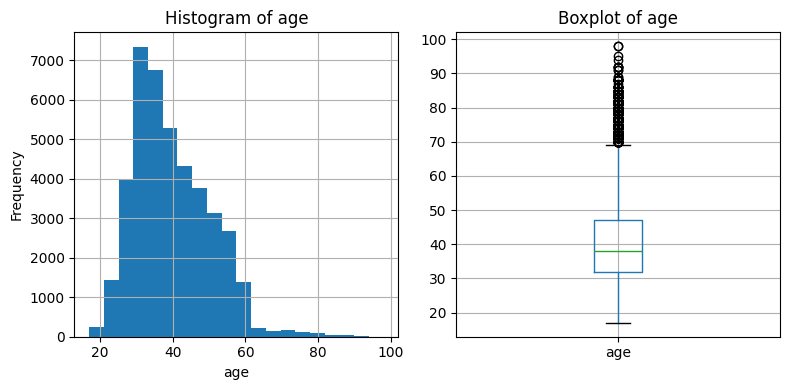

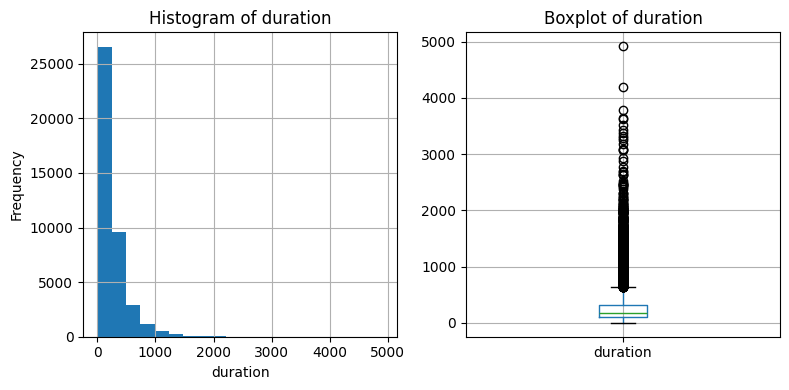

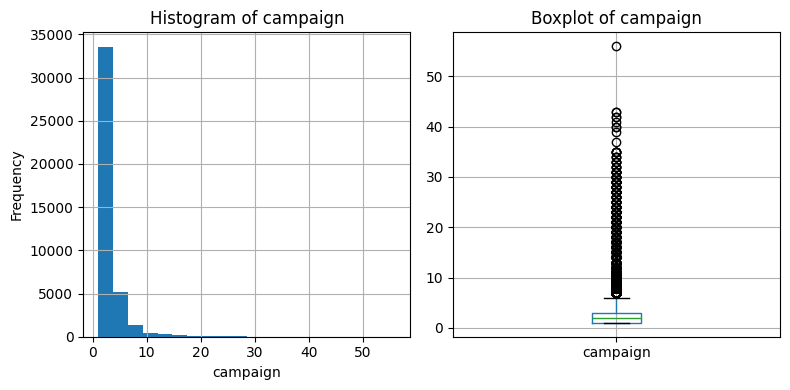

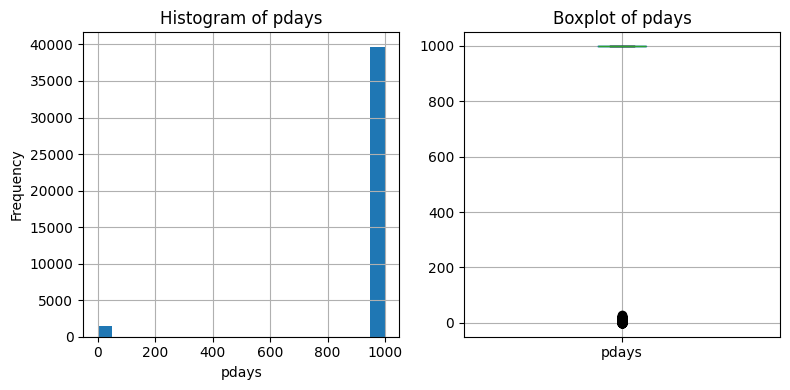

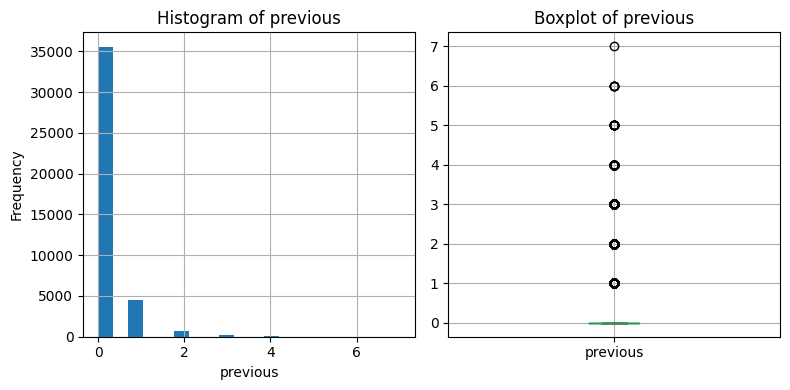

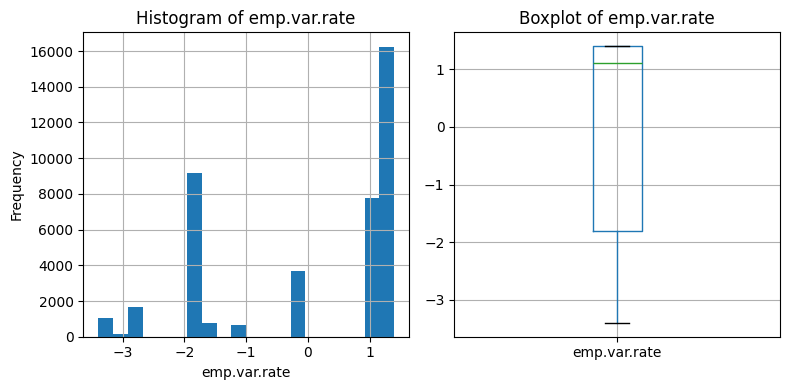

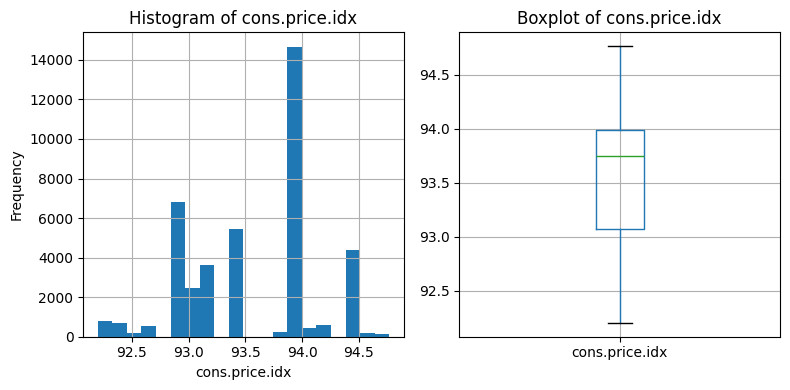

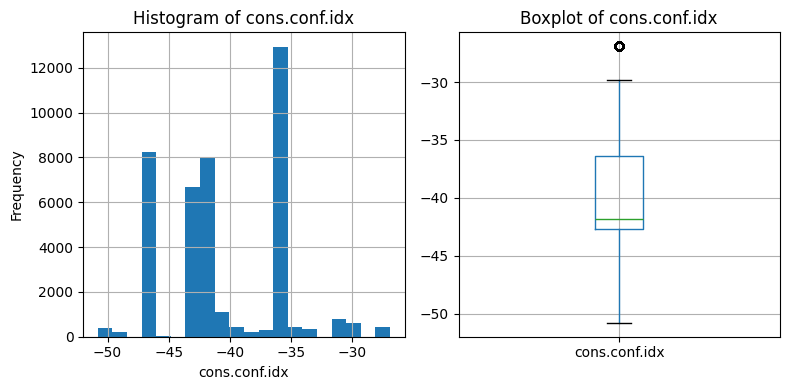

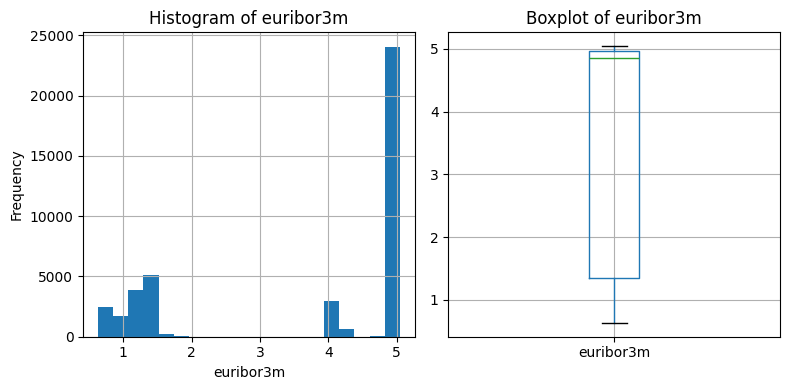

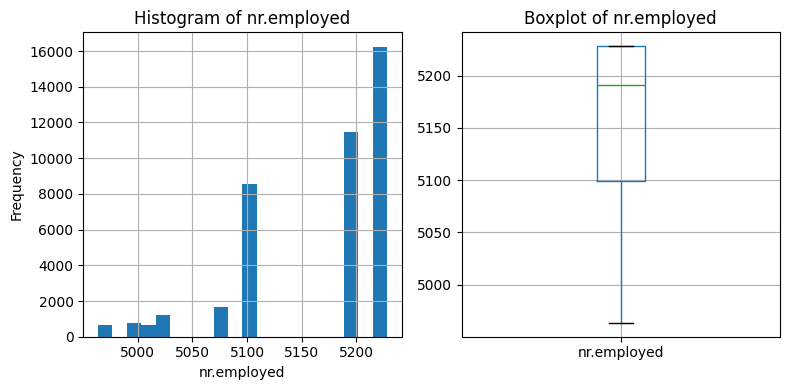

In [ ]:
numerical_cols = ['age', 'duration', 'campaign', 'pdays', 'previous', 'emp.var.rate', 'cons.price.idx', 'cons.conf.idx', 'euribor3m', 'nr.employed']

for col in numerical_cols:
    plt.figure(figsize=(8, 4))
    plt.subplot(1, 2, 1)
    df[col].hist(bins=20)
    plt.title(f'Histogram of {col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')

    plt.subplot(1, 2, 2)
    df.boxplot(column=col)
    plt.title(f'Boxplot of {col}')

    plt.tight_layout()
    plt.show()  # Or plt.savefig(f'{col}_dist.png') to save images

#### Insight
- Age: Mostly 30-50 years old, some outliers > 70
- Duration: Right-skewed, mean ~258 seconds, but includes 0 (no contact?).
- Pdays: Mostly 999 (not contacted before), so it's skewed.
- Campaign: Most contacts are 1-3, outliers up to 56.
- Note: 'duration' is predictive but should be excluded for real models as it's known post-call.
- Categorical Features: Bar plots for frequencies.


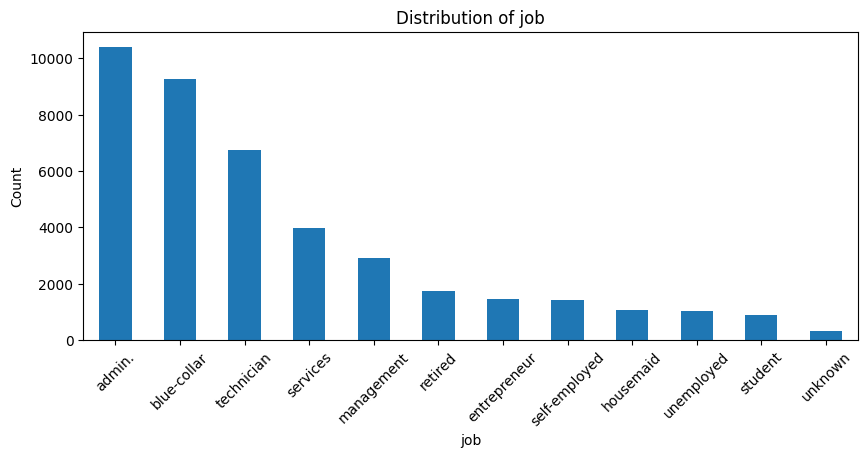

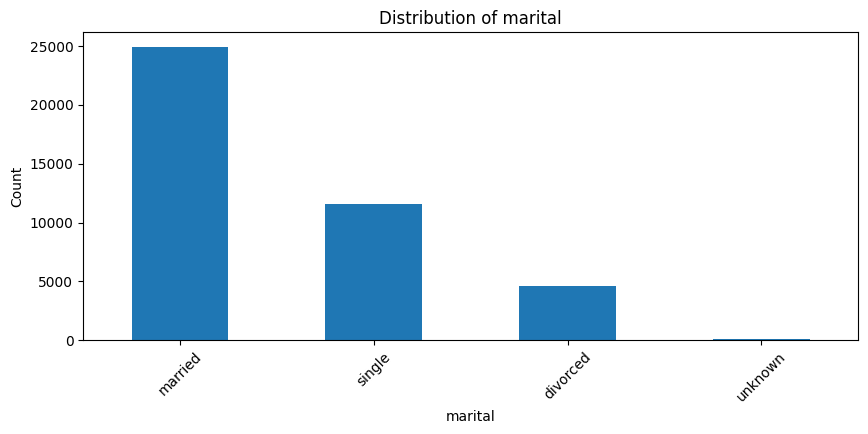

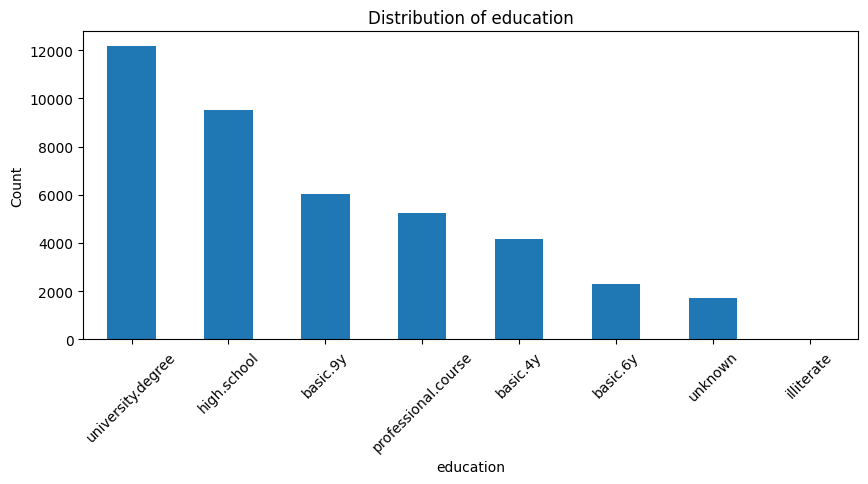

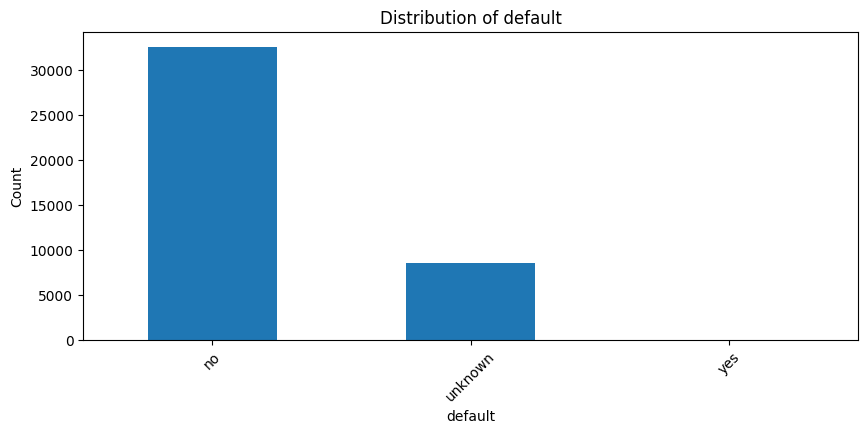

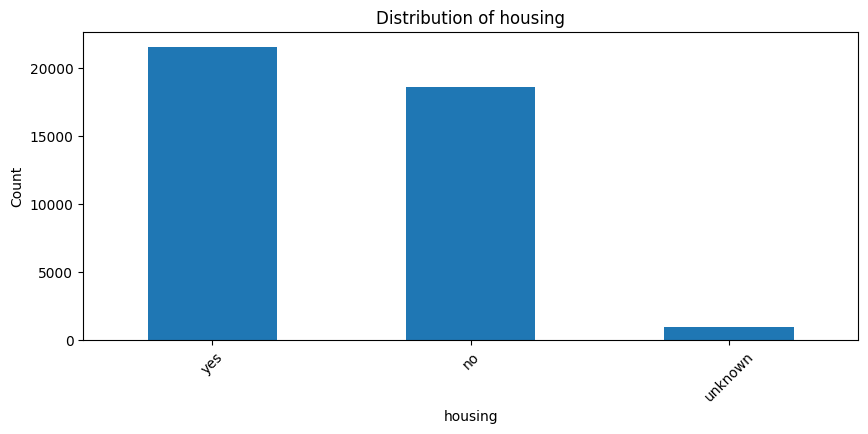

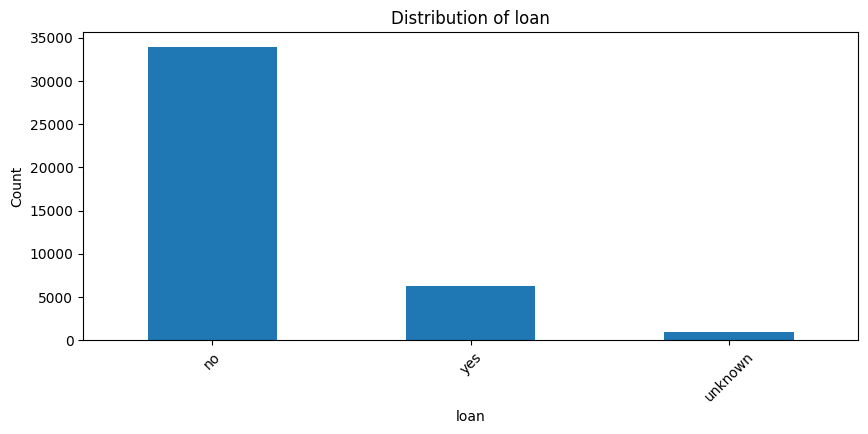

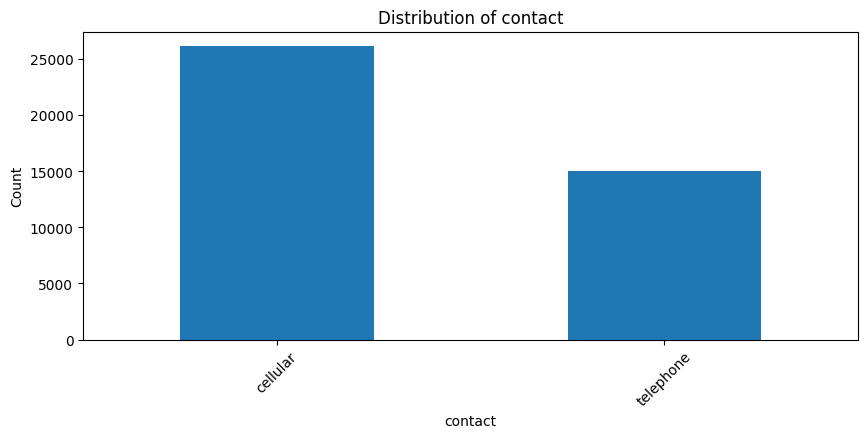

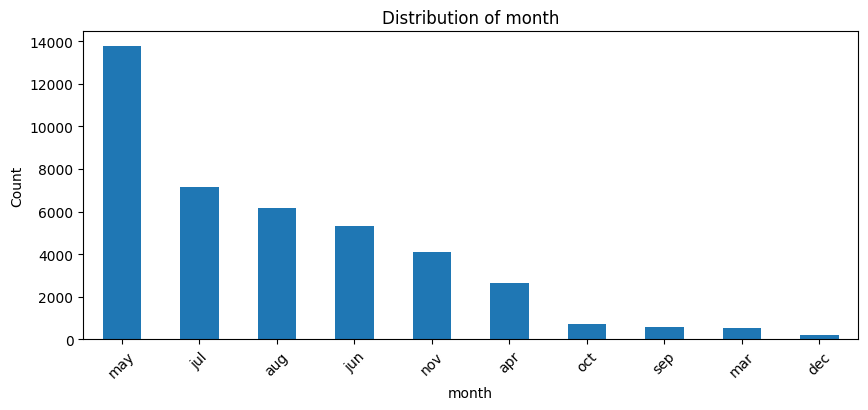

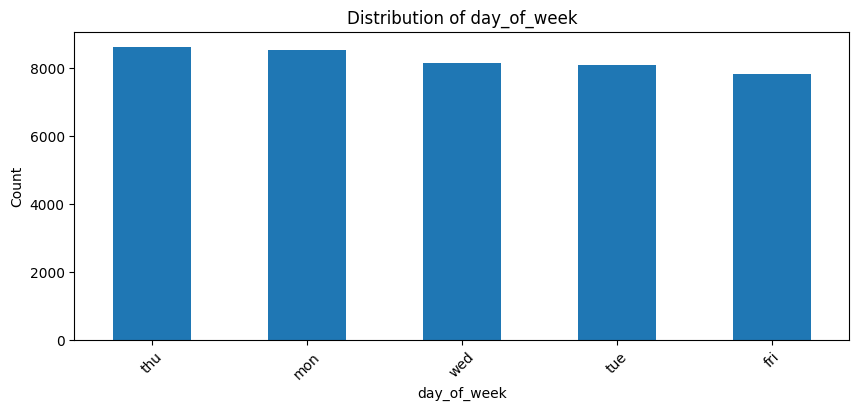

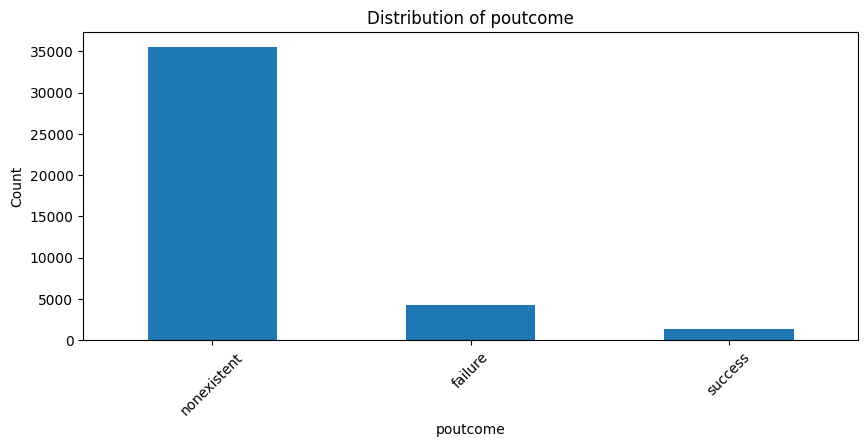

In [ ]:
for col in categorical_cols[:-1]:  # Exclude 'y' for now
    plt.figure(figsize=(10, 4))
    df[col].value_counts().plot(kind='bar')
    plt.title(f'Distribution of {col}')
    plt.xlabel(col)
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    plt.show()

#### Insights:

Job: 'admin.' (25%) and 'blue-collar' (22%) dominate.
Education: 'university.degree' (29%) most common.
Month: Heavy in May (33%), low in Dec/Mar.
Poutcome: Mostly 'nonexistent' (86%).

## Bivarate Analysis
Explore relationships between features and the target 'y'.

<Figure size 600x400 with 0 Axes>

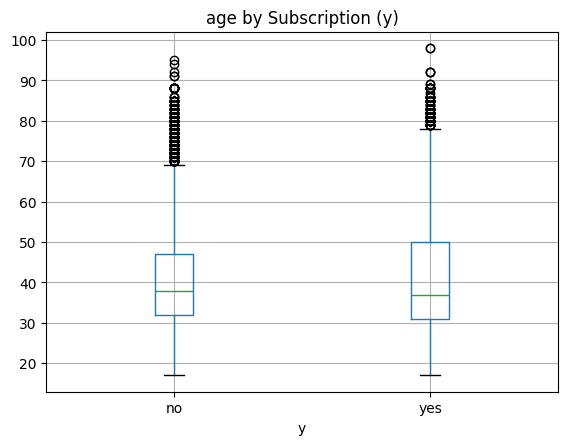

<Figure size 600x400 with 0 Axes>

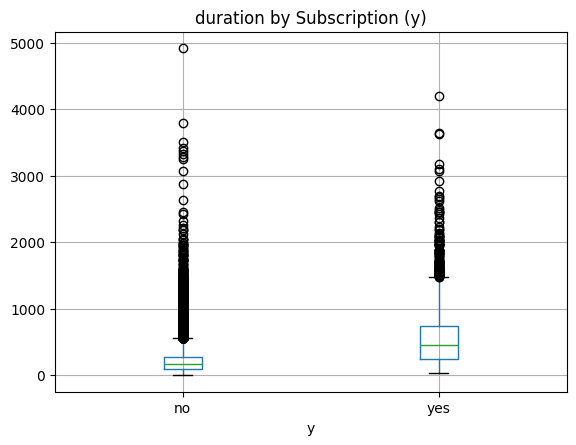

<Figure size 600x400 with 0 Axes>

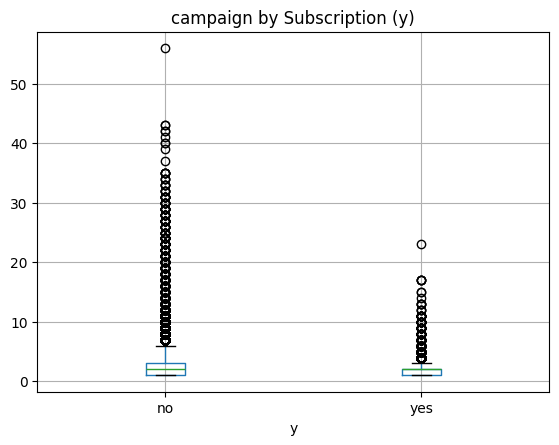

<Figure size 600x400 with 0 Axes>

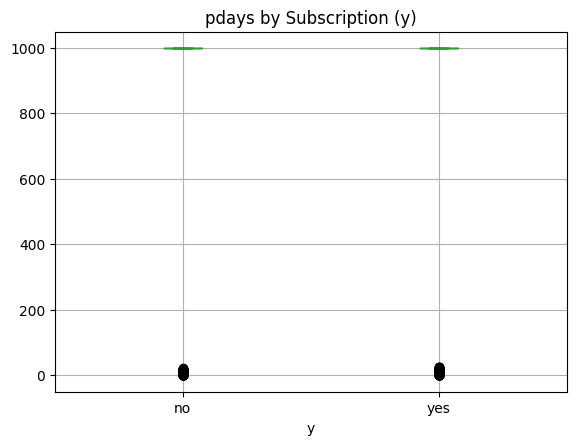

<Figure size 600x400 with 0 Axes>

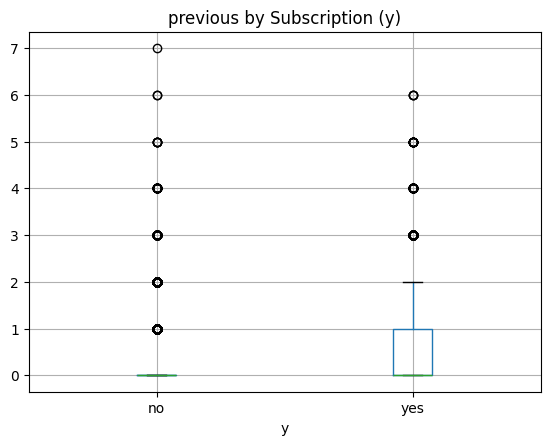

<Figure size 600x400 with 0 Axes>

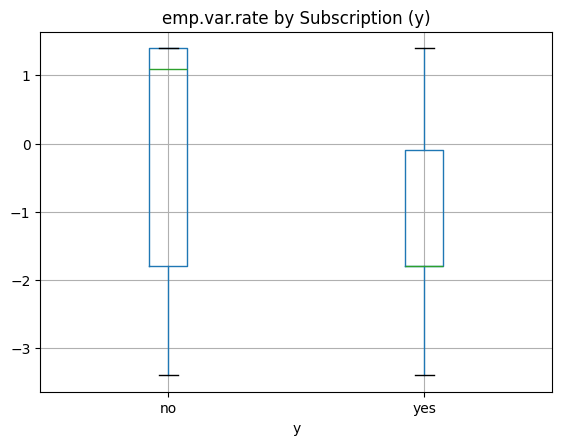

<Figure size 600x400 with 0 Axes>

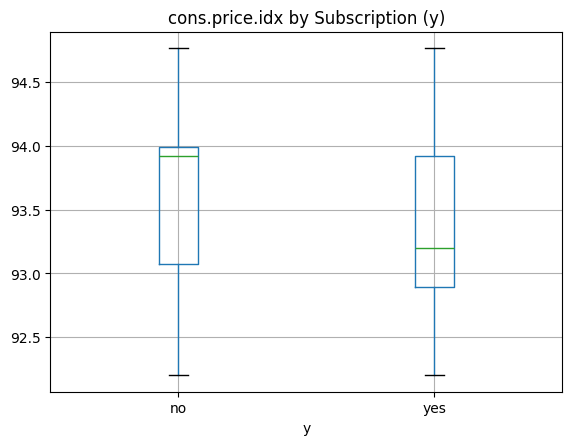

<Figure size 600x400 with 0 Axes>

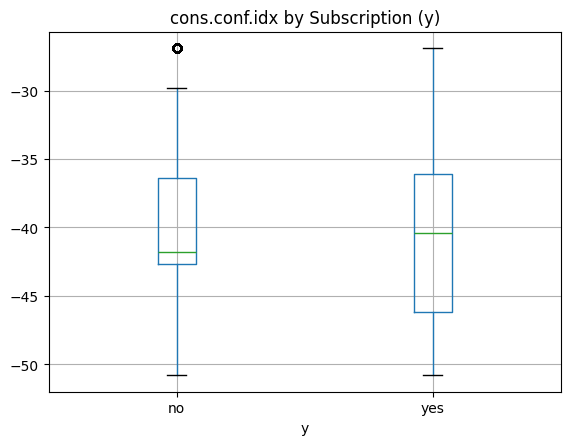

<Figure size 600x400 with 0 Axes>

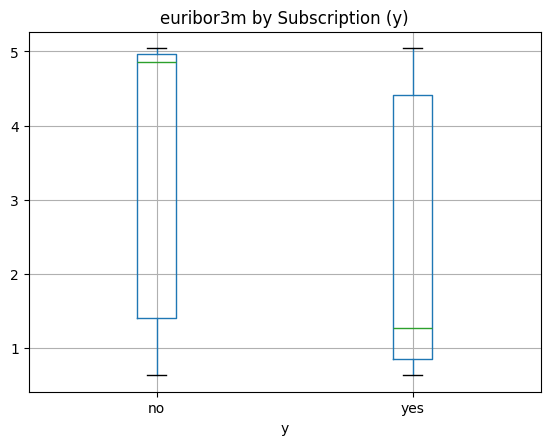

<Figure size 600x400 with 0 Axes>

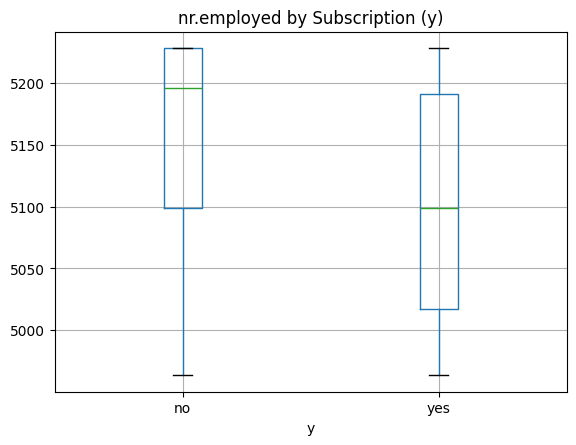

In [ ]:
# Numerical vs. Target: Box plots grouped by 'y'.
for col in numerical_cols:
    plt.figure(figsize=(6, 4))
    df.boxplot(column=col, by='y')
    plt.title(f'{col} by Subscription (y)')
    plt.suptitle('')  # Remove default title
    plt.show()

Insights: Subscribers ('yes') have longer 'duration' and lower 'pdays' (more recent contacts). Economic indicators like 'emp.var.rate' are lower for 'yes'.


Crosstab for job vs y (%):
y                     no        yes
job                                
admin.         87.027442  12.972558
blue-collar    93.105684   6.894316
entrepreneur   91.483516   8.516484
housemaid      90.000000  10.000000
management     88.782490  11.217510
retired        74.767442  25.232558
self-employed  89.514426  10.485574
services       91.861930   8.138070
student        68.571429  31.428571
technician     89.173958  10.826042
unemployed     85.798817  14.201183
unknown        88.787879  11.212121


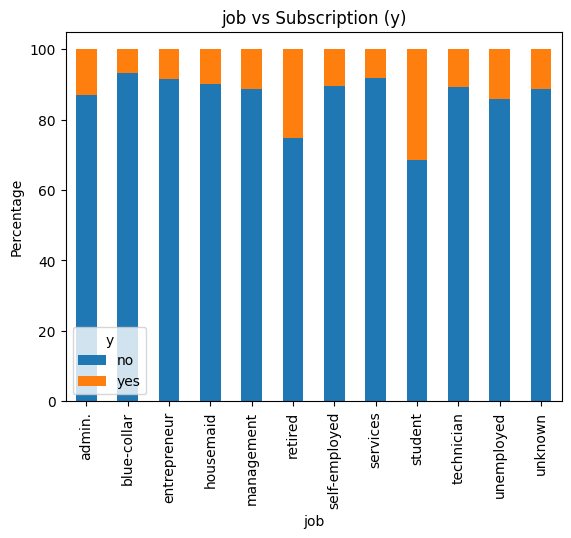


Crosstab for marital vs y (%):
y                no        yes
marital                       
divorced  89.679098  10.320902
married   89.842747  10.157253
single    85.995851  14.004149
unknown   85.000000  15.000000


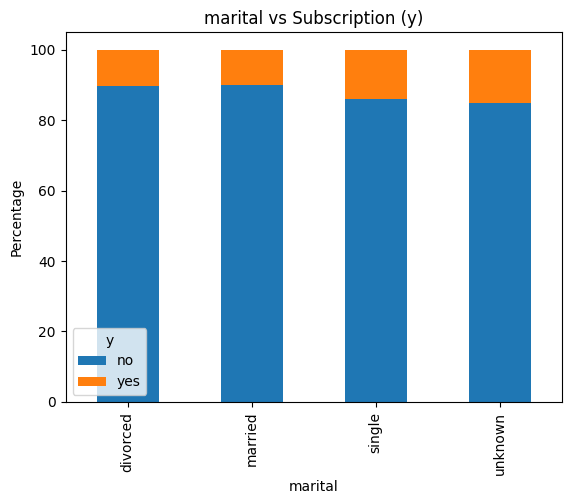


Crosstab for education vs y (%):
y                           no        yes
education                                
basic.4y             89.750958  10.249042
basic.6y             91.797557   8.202443
basic.9y             92.175352   7.824648
high.school          89.164477  10.835523
illiterate           77.777778  22.222222
professional.course  88.651535  11.348465
university.degree    86.275477  13.724523
unknown              85.499711  14.500289


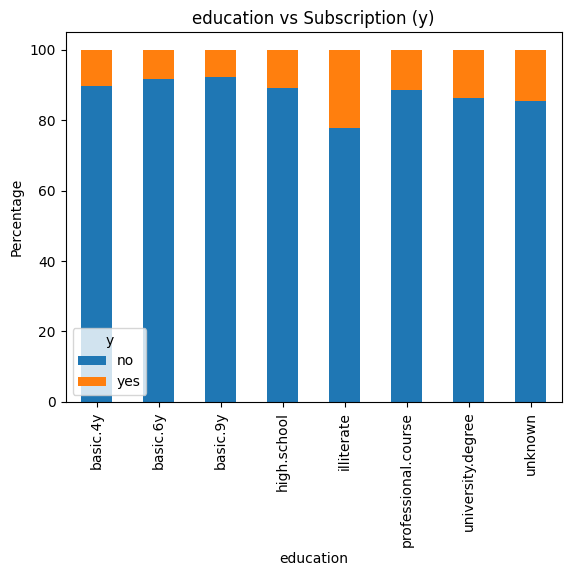


Crosstab for default vs y (%):
y                no        yes
default                       
no        87.121026  12.878974
unknown   94.847040   5.152960
yes      100.000000   0.000000


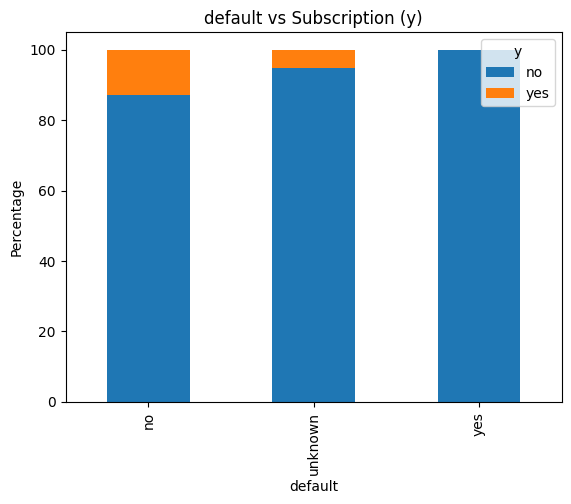


Crosstab for housing vs y (%):
y               no        yes
housing                      
no       89.120395  10.879605
unknown  89.191919  10.808081
yes      88.380608  11.619392


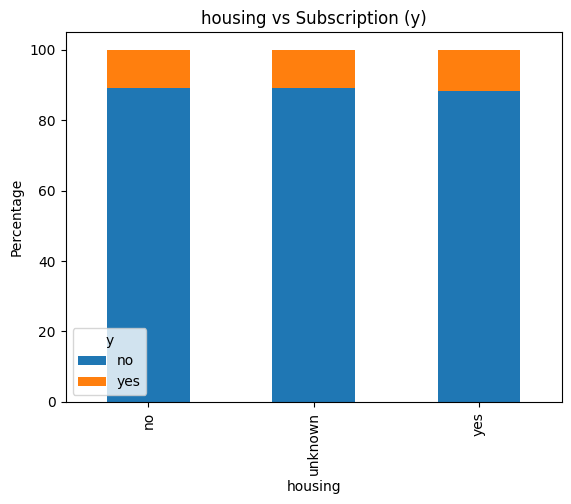


Crosstab for loan vs y (%):
y               no        yes
loan                         
no       88.659794  11.340206
unknown  89.191919  10.808081
yes      89.068502  10.931498


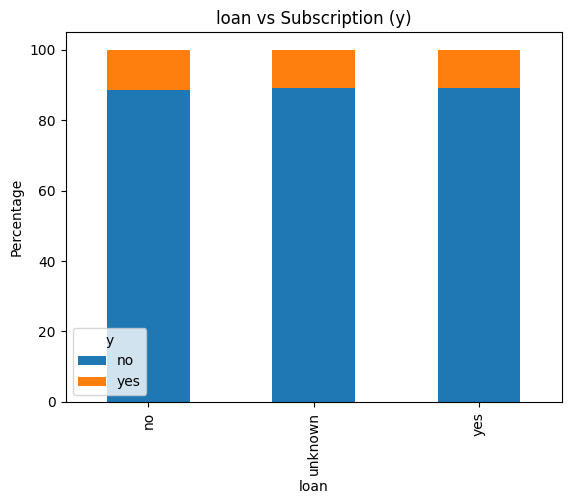


Crosstab for contact vs y (%):
y                 no        yes
contact                        
cellular   85.262393  14.737607
telephone  94.768679   5.231321


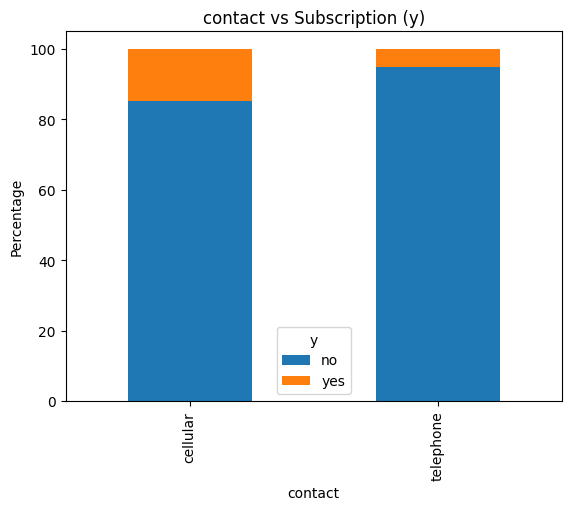


Crosstab for month vs y (%):
y             no        yes
month                      
apr    79.521277  20.478723
aug    89.397863  10.602137
dec    51.098901  48.901099
jul    90.953443   9.046557
jun    89.488530  10.511470
mar    49.450549  50.549451
may    93.565255   6.434745
nov    89.856133  10.143867
oct    56.128134  43.871866
sep    55.087719  44.912281


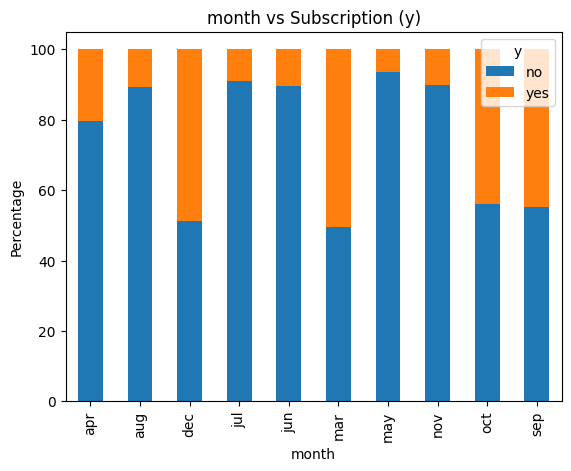


Crosstab for day_of_week vs y (%):
y                   no        yes
day_of_week                      
fri          89.191261  10.808739
mon          90.051680   9.948320
thu          87.881248  12.118752
tue          88.220025  11.779975
wed          88.332924  11.667076


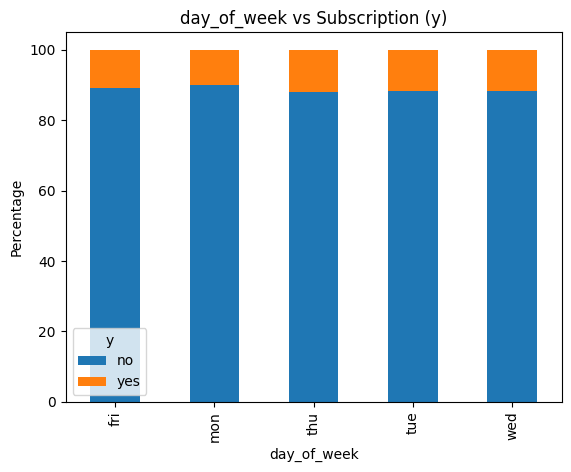


Crosstab for poutcome vs y (%):
y                   no        yes
poutcome                         
failure      85.771402  14.228598
nonexistent  91.167787   8.832213
success      34.887109  65.112891


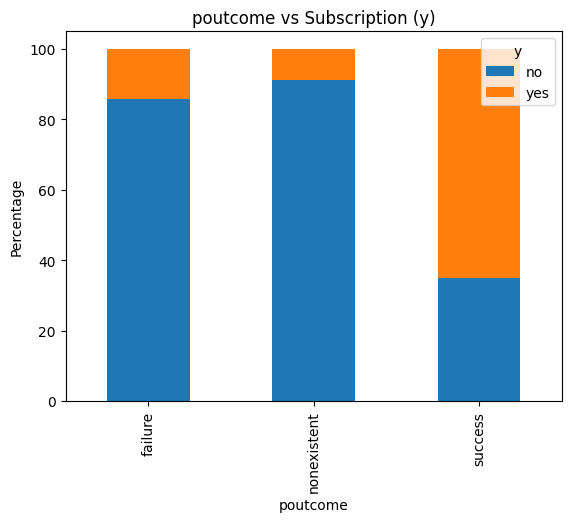

In [ ]:
# Categorical vs Target: Crosstab and stacked bar plots
for col in categorical_cols[:-1]:
    crosstab = pd.crosstab(df[col], df['y'], normalize='index') * 100  # % subscription rate
    print(f"\nCrosstab for {col} vs y (%):\n{crosstab}")

    crosstab.plot(kind='bar', stacked=True)
    plt.title(f'{col} vs Subscription (y)')
    plt.ylabel('Percentage')
    plt.show()

Insights:
- Job: 'Student' and 'Retired' has the highest subscription rate (~27-28%)
- Contact: 'cellular' has higher success (~15%) than 'telephone' (~5%).
- Month: Higher success in Mar/Sep/Oct/Dec (off-peak months, ~37-50%).
- Poutcome: 'success' in previous campaign leads to ~65% subscription.

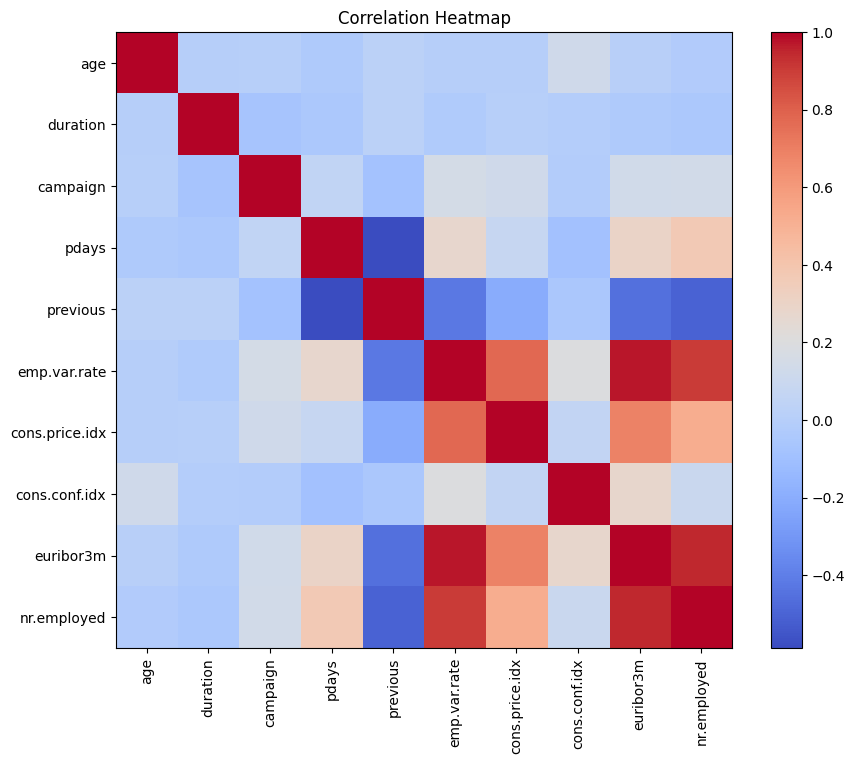

                     age  duration  campaign     pdays  previous  \
age             1.000000 -0.000866  0.004594 -0.034369  0.024365   
duration       -0.000866  1.000000 -0.071699 -0.047577  0.020640   
campaign        0.004594 -0.071699  1.000000  0.052584 -0.079141   
pdays          -0.034369 -0.047577  0.052584  1.000000 -0.587514   
previous        0.024365  0.020640 -0.079141 -0.587514  1.000000   
emp.var.rate   -0.000371 -0.027968  0.150754  0.271004 -0.420489   
cons.price.idx  0.000857  0.005312  0.127836  0.078889 -0.203130   
cons.conf.idx   0.129372 -0.008173 -0.013733 -0.091342 -0.050936   
euribor3m       0.010767 -0.032897  0.135133  0.296899 -0.454494   
nr.employed    -0.017725 -0.044703  0.144095  0.372605 -0.501333   

                emp.var.rate  cons.price.idx  cons.conf.idx  euribor3m  \
age                -0.000371        0.000857       0.129372   0.010767   
duration           -0.027968        0.005312      -0.008173  -0.032897   
campaign            0.150754 

In [ ]:
# Correlation for Numerical
corr_matrix = df[numerical_cols].corr()
plt.figure(figsize=(10, 8))
plt.imshow(corr_matrix, cmap='coolwarm', interpolation='none')
plt.colorbar()
plt.xticks(range(len(numerical_cols)), numerical_cols, rotation=90)
plt.yticks(range(len(numerical_cols)), numerical_cols)
plt.title('Correlation Heatmap')
plt.show()

print(corr_matrix)

Insight:
- High correlations between economic features (like 'euribor3m' and 'emp.var.rate' ~0.97%). 'duration' correlates midly with target.

### Multivarate Analysis and Outliers

In [ ]:
# =============================================
# Multivariate Analysis: Correlations
# =============================================

df['y_num'] = df['y'].map({'no': 0, 'yes': 1})
# Correlation matrix (numerical features + target)
corr_matrix = df[numerical_cols + ['y_num']].corr()

print("\n=== Correlation with Target (y) ===")
print(corr_matrix['y_num'].sort_values(ascending=False).round(3))

print("\n=== Full Correlation Matrix (Top High Correlations) ===")
# Extract and print pairs with |corr| > 0.7 (to avoid printing huge table)
threshold = 0.7
high_corrs = []
for i in range(len(corr_matrix)):
    for j in range(i+1, len(corr_matrix)):
        corr_val = corr_matrix.iloc[i, j]
        if abs(corr_val) > threshold:
            high_corrs.append((corr_matrix.columns[i], corr_matrix.columns[j], round(corr_val, 3)))

if high_corrs:
    high_corr_df = pd.DataFrame(high_corrs, columns=['Feature 1', 'Feature 2', 'Correlation'])
    print(high_corr_df.to_string(index=False))
else:
    print("No correlations above threshold.")


=== Correlation with Target (y) ===
y_num             1.000
duration          0.405
previous          0.230
cons.conf.idx     0.055
age               0.030
campaign         -0.066
cons.price.idx   -0.136
emp.var.rate     -0.298
euribor3m        -0.308
pdays            -0.325
nr.employed      -0.355
Name: y_num, dtype: float64

=== Full Correlation Matrix (Top High Correlations) ===
   Feature 1      Feature 2  Correlation
emp.var.rate cons.price.idx        0.775
emp.var.rate      euribor3m        0.972
emp.var.rate    nr.employed        0.907
   euribor3m    nr.employed        0.945


In [ ]:
# =============================================
# Multivariate Analysis: Group Stats
# =============================================

print("\n=== Mean Numerical Features by Subscription (y) ===")
group_means = df.groupby('y')[numerical_cols].mean().round(2).T
group_means.columns = ['No Subscription', 'Yes Subscription']
print(group_means)

# Example multivariate: Economic indicators cluster
print("\n=== Economic Indicators by Subscription ===")
econ_cols = ['emp.var.rate', 'cons.price.idx', 'cons.conf.idx', 'euribor3m', 'nr.employed']
print(df.groupby('y')[econ_cols].mean().round(3))


=== Mean Numerical Features by Subscription (y) ===
                No Subscription  Yes Subscription
age                       39.91             40.91
duration                 220.84            553.19
campaign                   2.63              2.05
pdays                    984.11            792.04
previous                   0.13              0.49
emp.var.rate               0.25             -1.23
cons.price.idx            93.60             93.35
cons.conf.idx            -40.59            -39.79
euribor3m                  3.81              2.12
nr.employed             5176.17           5095.12

=== Economic Indicators by Subscription ===
     emp.var.rate  cons.price.idx  cons.conf.idx  euribor3m  nr.employed
y                                                                       
no          0.249          93.604        -40.593      3.811     5176.167
yes        -1.233          93.354        -39.790      2.123     5095.116


In [ ]:
# =============================================
# Outliers Detection (IQR Method)
# =============================================`

print("\n=== Outliers Summary (IQR Method) ===")
outlier_info = []

key_features = ['age', 'duration', 'campaign', 'pdays', 'previous']

for col in key_features:
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR_val = Q3 - Q1
    lower = Q1 - 1.5 * IQR_val
    upper = Q3 + 1.5 * IQR_val

    outliers = df[(df[col] < lower) | (df[col] > upper)]
    outlier_count = len(outliers)
    outlier_pct = round((outlier_count / len(df)) * 100, 2)

    outlier_info.append({
        'Feature': col,
        'Q1': round(Q1, 2),
        'Q3': round(Q3, 2),
        'Lower Bound': round(lower, 2),
        'Upper Bound': round(upper, 2),
        'Outlier Count': outlier_count,
        'Outlier %': outlier_pct
    })

    print(f"{col}: {outlier_count} outliers ({outlier_pct}%)")

outliers_df = pd.DataFrame(outlier_info)
print("\nOutliers Table:")
print(outliers_df.to_string(index=False))

# Special note for pdays
pdays_999_count = (df['pdays'] == 999).sum()
print(f"\nSpecial: pdays == 999 (no previous contact): {pdays_999_count} ({round(pdays_999_count/len(df)*100, 2)}%)")


=== Outliers Summary (IQR Method) ===
age: 469 outliers (1.14%)
duration: 2963 outliers (7.19%)
campaign: 2406 outliers (5.84%)
pdays: 1515 outliers (3.68%)
previous: 5625 outliers (13.66%)

Outliers Table:
 Feature    Q1    Q3  Lower Bound  Upper Bound  Outlier Count  Outlier %
     age  32.0  47.0          9.5         69.5            469       1.14
duration 102.0 319.0       -223.5        644.5           2963       7.19
campaign   1.0   3.0         -2.0          6.0           2406       5.84
   pdays 999.0 999.0        999.0        999.0           1515       3.68
previous   0.0   0.0          0.0          0.0           5625      13.66

Special: pdays == 999 (no previous contact): 39673 (96.32%)


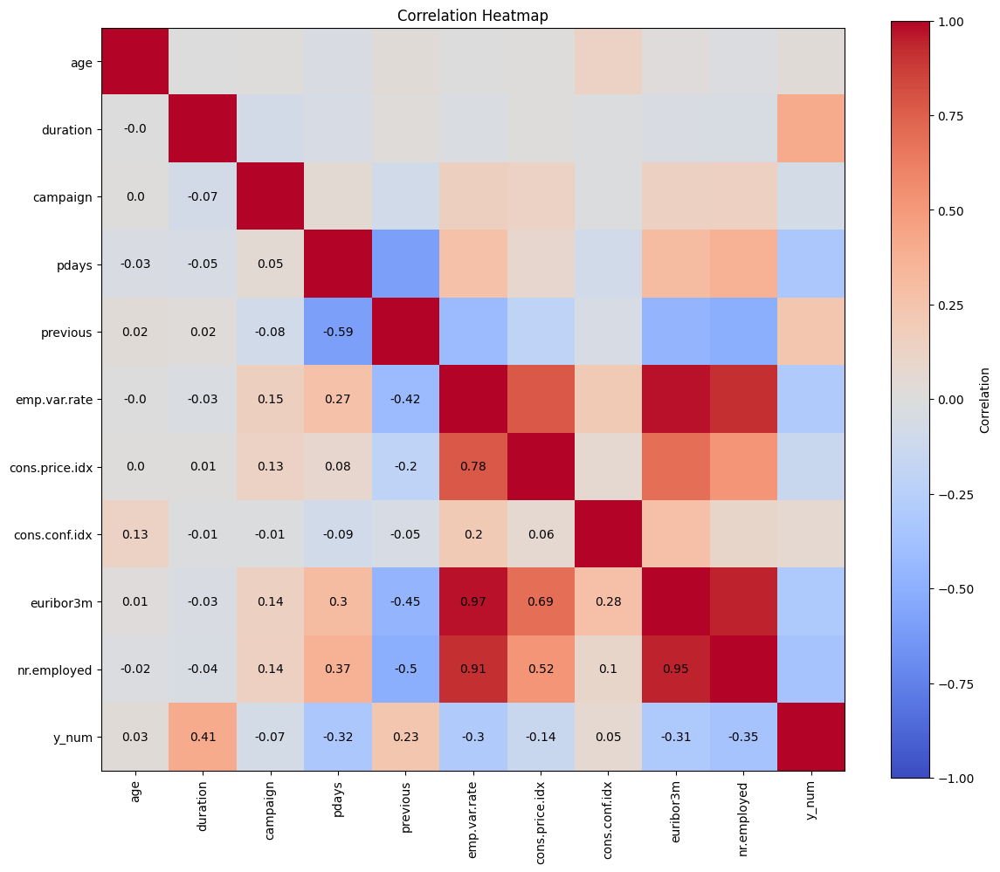

Heatmap saved as 'correlation_heatmap.png'


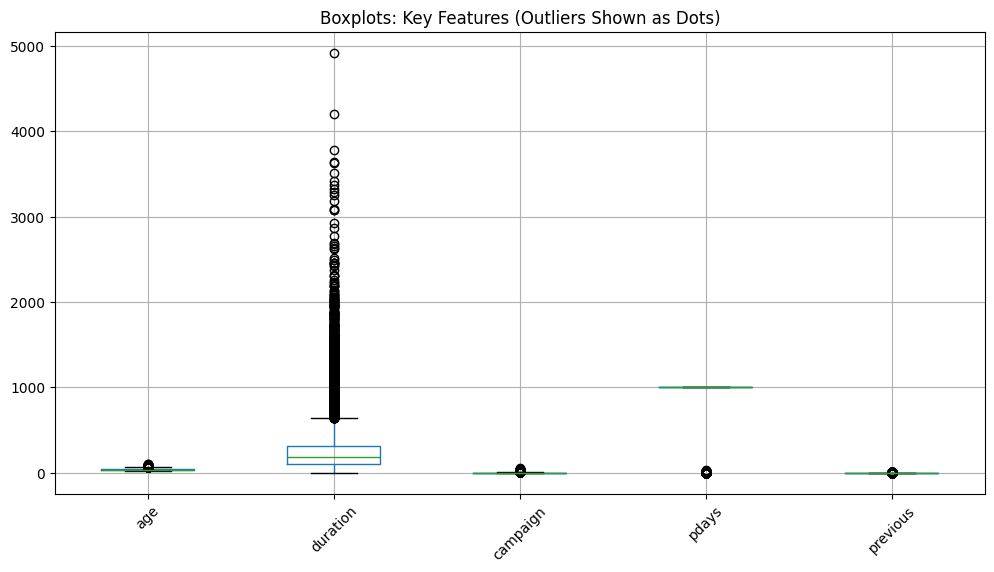

Boxplots saved as 'outliers_boxplots.png'


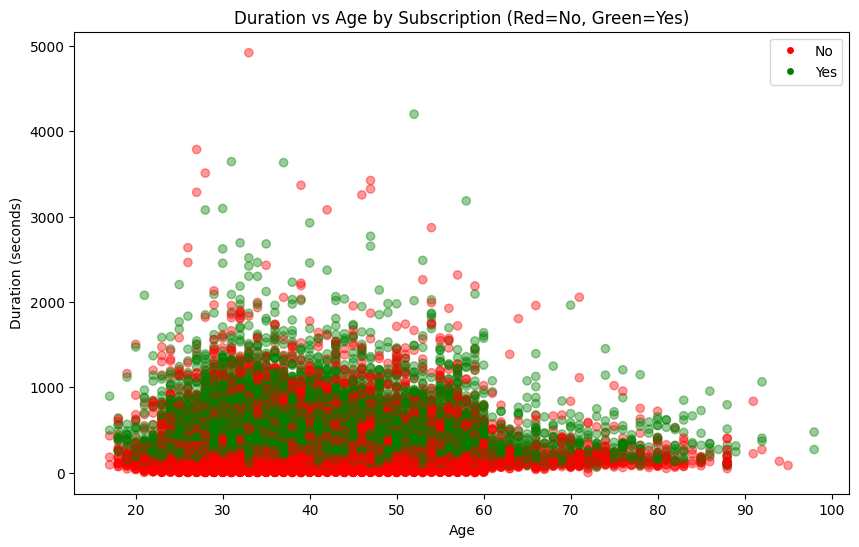

Scatter plot saved as 'duration_vs_age_scatter.png'


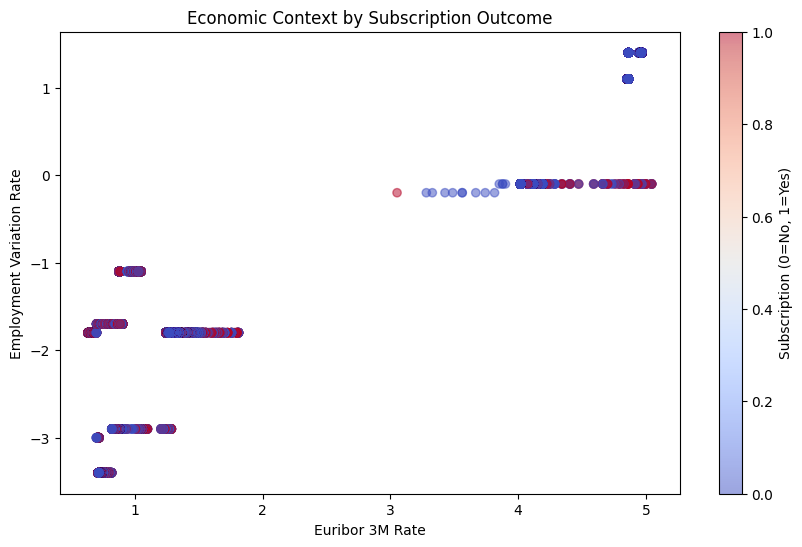

Economic scatter saved as 'economic_scatter.png'


In [ ]:
# =============================================
# Data Visualization
# =============================================

# 1. Correlation Heatmap (basic with matplotlib)
plt.figure(figsize=(12, 10))
mask = np.triu(corr_matrix)  # Upper triangle mask
plt.imshow(corr_matrix, cmap='coolwarm', vmin=-1, vmax=1)
plt.colorbar(label='Correlation')
plt.xticks(range(len(corr_matrix.columns)), corr_matrix.columns, rotation=90)
plt.yticks(range(len(corr_matrix.columns)), corr_matrix.columns)
plt.title('Correlation Heatmap')
for i in range(len(corr_matrix)):
    for j in range(len(corr_matrix)):
        if not mask[i,j]:  # Only lower triangle
            plt.text(j, i, round(corr_matrix.iloc[i,j], 2),
                     ha='center', va='center', color='black')
plt.tight_layout()
plt.savefig('correlation_heatmap.png')
plt.show()
print("Heatmap saved as 'correlation_heatmap.png'")

# 2. Boxplots for outliers in key features
plt.figure(figsize=(12, 6))
df[key_features].boxplot()
plt.title('Boxplots: Key Features (Outliers Shown as Dots)')
plt.xticks(rotation=45)
plt.savefig('outliers_boxplots.png')
plt.show()
print("Boxplots saved as 'outliers_boxplots.png'")

# 3. Scatter: Duration vs Age colored by subscription
plt.figure(figsize=(10, 6))
colors = ['red' if x == 0 else 'green' for x in df['y_num']]
plt.scatter(df['age'], df['duration'], c=colors, alpha=0.4)
plt.xlabel('Age')
plt.ylabel('Duration (seconds)')
plt.title('Duration vs Age by Subscription (Red=No, Green=Yes)')
plt.legend(handles=[plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='red', label='No'),
                    plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='green', label='Yes')])
plt.savefig('duration_vs_age_scatter.png')
plt.show()
print("Scatter plot saved as 'duration_vs_age_scatter.png'")

# 4. Economic indicators scatter
plt.figure(figsize=(10, 6))
plt.scatter(df['euribor3m'], df['emp.var.rate'], c=df['y_num'], cmap='coolwarm', alpha=0.5)
plt.colorbar(label='Subscription (0=No, 1=Yes)')
plt.xlabel('Euribor 3M Rate')
plt.ylabel('Employment Variation Rate')
plt.title('Economic Context by Subscription Outcome')
plt.savefig('economic_scatter.png')
plt.show()
print("Economic scatter saved as 'economic_scatter.png'")

# Data Cleaning
As we could see that before EDA process, i have also check the 'unknown' value and also its percentage:
- job has 330 'unknown' values (0.80%)
- marital has 80 'unknown' values (0.19%)
- education has 1731 'unknown' values (4.20%)
- default has 8597 'unknown' values (20.87%)
- housing has 990 'unknown' values (2.40%)
- loan has 990 'unknown' values (2.40%)

Next step is replace all 'unknown' value into NaN value, then impute all the missing values in categorical feature with mode value.

In [ ]:
# Replace 'unknown' value to 'NaN'
df_clean = df.replace('unknown', np.nan)

# Impute categorical missing values with mode
cat_missing_cols = ['job', 'marital', 'education', 'default', 'housing', 'loan']
for col in cat_missing_cols:
    mode_val = df_clean[col].mode()[0]
    df_clean[col].fillna(mode_val, inplace=True)
    print(f"Imputed {col} with mode: '{mode_val}'")


Imputed job with mode: 'admin.'
Imputed marital with mode: 'married'
Imputed education with mode: 'university.degree'
Imputed default with mode: 'no'
Imputed housing with mode: 'yes'
Imputed loan with mode: 'no'


/tmp/ipython-input-3573049783.py:8: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df_clean[col].fillna(mode_val, inplace=True)


In [ ]:
# Handle pdays by creating flag and replace 999 with NaN or any large values
df_clean['was_contacted_before'] = (df_clean['pdays'] != 999).astype(int)
df_clean['pdays'] = df_clean['pdays'].replace(999, np.nan)

# Drop duration
df_clean.drop('duration', axis=1, inplace=True)
print("Dropped 'duration' (data leakage)")


In [ ]:
from sklearn.preprocessing import LabelEncoder
# Handle outliers - cap 'campaign' at 95th percentile
campaign_cap = df_clean['campaign'].quantile(0.95)
df_clean['campaign'] = df_clean['campaign'].clip(upper=campaign_cap)
print(f"Capped 'campaign' at 95th percentile: {campaign_cap}")

# Encoding categorical features (Label Encoding)
label_encoders = {}
cat_cols = df_clean.select_dtypes(include='object').columns.drop('y')  # Exclude target

for col in cat_cols:
    le = LabelEncoder()
    df_clean[col] = le.fit_transform(df_clean[col].astype(str))
    label_encoders[col] = le

# Encode target
df_clean['y'] = df_clean['y'].map({'no': 0, 'yes': 1})

print("\nLabel Encoding completed for categoricals and target")

Capped 'campaign' at 95th percentile: 7.0

Label Encoding completed for categoricals and target


In [35]:
# Final dataset info
print("\n=== After Cleaning ===")
print(f"Shape: {df_clean.shape}")  # (41188, 21) - added 1 flag, dropped duration
print(f"Remaining missing values: {df_clean.isnull().sum().sum()}")  # Only pdays if not imputed
print("\nFirst 5 rows of cleaned data:")
print(df_clean.head())


=== After Cleaning ===
Shape: (41188, 22)
Remaining missing values: 39673

First 5 rows of cleaned data:
   age  job  marital  education  default  housing  loan  contact  month  \
0   56    3        1          0        0        0     0        1      6   
1   57    7        1          3        0        0     0        1      6   
2   37    7        1          3        0        1     0        1      6   
3   40    0        1          1        0        0     0        1      6   
4   56    7        1          3        0        0     1        1      6   

   day_of_week  ...  previous  poutcome  emp.var.rate  cons.price.idx  \
0            1  ...         0         1           1.1          93.994   
1            1  ...         0         1           1.1          93.994   
2            1  ...         0         1           1.1          93.994   
3            1  ...         0         1           1.1          93.994   
4            1  ...         0         1           1.1          93.994   

   c

In [36]:
df_clean.to_csv('bank_cleaned.csv', index=False)
print("\nCleaned dataset saved as 'bank_cleaned.csv'")


Cleaned dataset saved as 'bank_cleaned.csv'


# Data Analysis Process

Table 1: Subscription Rate by Previous Campaign Outcome
             Total Clients  Yes (Subscribed)     No  Subscription Rate (% yes)
poutcome                                                                      
success               1373               894    479                       65.1
failure               4252               605   3647                       14.2
nonexistent          35563              3141  32422                        8.8


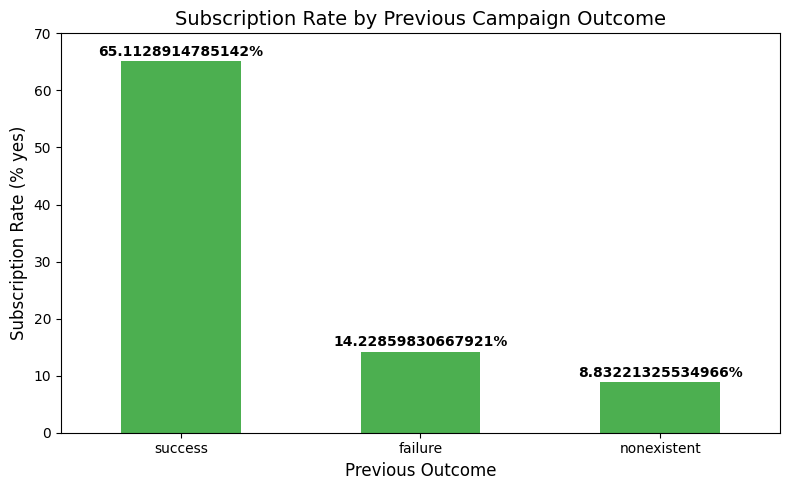

In [40]:
# Subscription Rate by Poutcome
poutcome_table = pd.crosstab(df['poutcome'], df['y'])
poutcome_table['Total Clients'] = poutcome_table['no'] + poutcome_table['yes']
poutcome_table['Subscription Rate (% yes)'] = (poutcome_table['yes'] / poutcome_table['Total Clients'] * 100).round(1)
table1 = poutcome_table.loc[['success', 'failure', 'nonexistent'], ['Total Clients', 'yes', 'no', 'Subscription Rate (% yes)']]
table1.columns = ['Total Clients', 'Yes (Subscribed)', 'No', 'Subscription Rate (% yes)']
print("Table 1: Subscription Rate by Previous Campaign Outcome")
print(table1)
poutcome_rates = (pd.crosstab(df['poutcome'], df['y'], normalize='index')['yes'] * 100)
poutcome_rates = poutcome_rates.loc[['success', 'failure', 'nonexistent']]
ax = poutcome_rates.plot(kind='bar', color='#4CAF50', figsize=(8, 5), legend=False)
plt.title('Subscription Rate by Previous Campaign Outcome', fontsize=14)
plt.ylabel('Subscription Rate (% yes)', fontsize=12)
plt.xlabel('Previous Outcome', fontsize=12)
plt.ylim(0, 70)
plt.xticks(rotation=0)
for i, v in enumerate(poutcome_rates):
    ax.text(i, v + 1, f"{v}%", ha='center', fontweight='bold')
plt.tight_layout()
plt.savefig('poutcome_chart.png')
plt.show()


Table 2: Subscription Rate by Contact Month
y      Total Contacts  Subscription Rate (% yes)  Rank
month                                                 
mar               546                       50.5     1
dec               182                       48.9     2
sep               570                       44.9     3
oct               718                       43.9     4
apr              2632                       20.5     5
aug              6178                       10.6     6
jun              5318                       10.5     7
nov              4101                       10.1     8
jul              7174                        9.0     9
may             13769                        6.4    10

Insight: Dramatically higher rates in low-volume months (mar, dec, sep, oct) – likely due to less client fatigue.



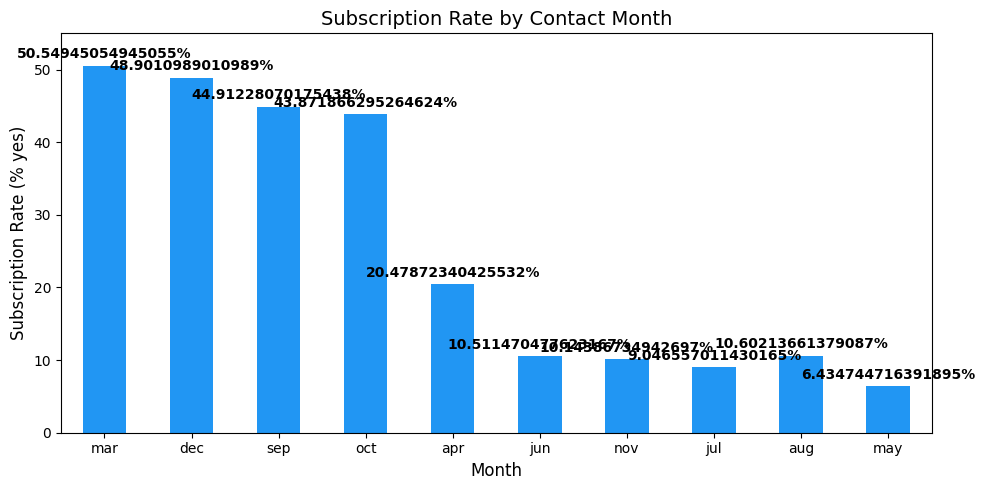

In [41]:
# Subscription Rate by Contact Month
month_table = pd.crosstab(df['month'], df['y'])
month_table['Total Contacts'] = month_table['yes'] + month_table['no']
month_table['Subscription Rate (% yes)'] = (month_table['yes'] / month_table['Total Contacts'] * 100).round(1)

table2 = month_table.sort_values('Subscription Rate (% yes)', ascending=False)
table2['Rank'] = range(1, len(table2) + 1)
table2 = table2[['Total Contacts', 'Subscription Rate (% yes)', 'Rank']]
print("\nTable 2: Subscription Rate by Contact Month")
print(table2)
print("\nInsight: Dramatically higher rates in low-volume months (mar, dec, sep, oct) – likely due to less client fatigue.\n")

# Bar chart
month_order = ['mar', 'dec', 'sep', 'oct', 'apr', 'jun', 'nov', 'jul', 'aug', 'may']
month_rates = (pd.crosstab(df['month'], df['y'], normalize='index')['yes'] * 100).reindex(month_order)
ax = month_rates.plot(kind='bar', color='#2196F3', figsize=(10, 5), legend=False)
plt.title('Subscription Rate by Contact Month', fontsize=14)
plt.ylabel('Subscription Rate (% yes)', fontsize=12)
plt.xlabel('Month', fontsize=12)
plt.ylim(0, 55)
plt.xticks(rotation=0)
for i, v in enumerate(month_rates):
    ax.text(i, v + 1, f"{v}%", ha='center', fontweight='bold')
plt.tight_layout()
plt.savefig('month_chart.png')
plt.show()


Table 3: Subscription Rate by Job Category
y              Total  Subscription Rate (% yes)
job                                            
student          875                       31.4
retired         1720                       25.2
unemployed      1014                       14.2
admin.         10422                       13.0
unknown          330                       11.2
management      2924                       11.2
technician      6743                       10.8
self-employed   1421                       10.5
housemaid       1060                       10.0
entrepreneur    1456                        8.5
services        3969                        8.1
blue-collar     9254                        6.9

Insight: Students and retirees convert 3–4× better – strong life-stage effect.



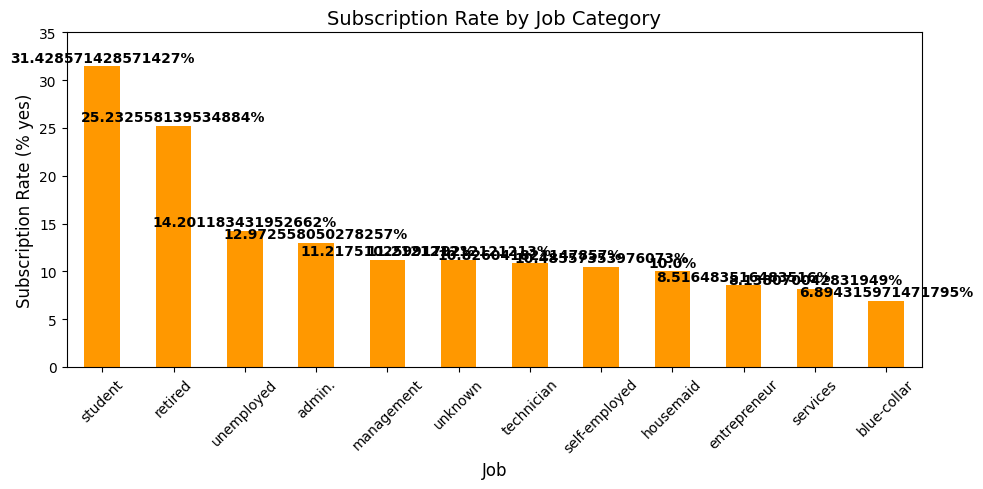

In [42]:
# Subscription Rate by Job Category
job_table = pd.crosstab(df['job'], df['y'])
job_table['Total'] = job_table['yes'] + job_table['no']
job_table['Subscription Rate (% yes)'] = (job_table['yes'] / job_table['Total'] * 100).round(1)

table3 = job_table.sort_values('Subscription Rate (% yes)', ascending=False)[['Total', 'Subscription Rate (% yes)']]
print("\nTable 3: Subscription Rate by Job Category")
print(table3)
print("\nInsight: Students and retirees convert 3–4× better – strong life-stage effect.\n")

# Bar chart
job_rates = (pd.crosstab(df['job'], df['y'], normalize='index')['yes'] * 100).sort_values(ascending=False)
ax = job_rates.plot(kind='bar', color='#FF9800', figsize=(10, 5), legend=False)
plt.title('Subscription Rate by Job Category', fontsize=14)
plt.ylabel('Subscription Rate (% yes)', fontsize=12)
plt.xlabel('Job', fontsize=12)
plt.ylim(0, 35)
plt.xticks(rotation=45)
for i, v in enumerate(job_rates):
    ax.text(i, v + 0.5, f"{v}%", ha='center', fontweight='bold')
plt.tight_layout()
plt.savefig('job_chart.png')
plt.show()